<a href="https://colab.research.google.com/github/yiryuan/Market-Analysis-/blob/main/YuanAssignmentII.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Part I: Segmentation 

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn import preprocessing
food_trucks = pd.read_csv("food_trucks.csv")
woodie = pd.read_csv("woodie.csv")

In [ ]:
food_trucks2=food_trucks.iloc[:,1:]

Categorical variables like VendorID cannot be used in distance-based clustering models because they cannot be combined mathematically or scaled in a meaningful way.

In [ ]:
food_trucks2.describe()

,avg_transaction_cost,mnths_operational,days_yr,avg_cost_item,number_trucks,dist_lobland,bev_percent
count,248.000000,248.000000,248.000000,248.000000,248.000000,248.000000,248.000000
mean,14.334274,3.622581,148.822581,5.008468,3.044355,52.435484,40.824194
std,1.412888,3.779335,18.942080,1.683380,1.719750,52.002194,5.775277
min,8.810000,0.000000,88.000000,-0.270000,0.000000,0.120000,25.400000
25%,13.360000,1.175000,136.750000,3.780000,2.000000,16.305000,37.200000
50%,14.395000,2.600000,149.000000,5.090000,3.000000,38.315000,40.700000
75%,15.242500,4.500000,162.000000,6.105000,4.000000,68.637500,44.200000
max,18.320000,27.300000,202.000000,10.130000,9.000000,271.730000,58.600000


This function provides an overall sense of the distribution of values in the dataset and helps the analyst to understand the characteristics of the data. 

In [ ]:
food_trucks2.isnull().sum()

avg_transaction_cost    0
mnths_operational       0
days_yr                 0
avg_cost_item           0
number_trucks           0
dist_lobland            0
bev_percent             0
dtype: int64

In [ ]:
food_trucks2.describe()

,avg_transaction_cost,mnths_operational,days_yr,avg_cost_item,number_trucks,dist_lobland,bev_percent
count,248.000000,248.000000,248.000000,248.000000,248.000000,248.000000,248.000000
mean,14.334274,3.622581,148.822581,5.008468,3.044355,52.435484,40.824194
std,1.412888,3.779335,18.942080,1.683380,1.719750,52.002194,5.775277
min,8.810000,0.000000,88.000000,-0.270000,0.000000,0.120000,25.400000
25%,13.360000,1.175000,136.750000,3.780000,2.000000,16.305000,37.200000
50%,14.395000,2.600000,149.000000,5.090000,3.000000,38.315000,40.700000
75%,15.242500,4.500000,162.000000,6.105000,4.000000,68.637500,44.200000
max,18.320000,27.300000,202.000000,10.130000,9.000000,271.730000,58.600000


There is no missing value in the dataset. The impossible value is the min value of avg_cost_item which is negative

In [ ]:
df1=food_trucks2[food_trucks2['avg_cost_item'] < 0]
df1

,avg_transaction_cost,mnths_operational,days_yr,avg_cost_item,number_trucks,dist_lobland,bev_percent
59,11.38,6.2,139,-0.27,2,2.87,42.2


I chose to drop the impossible value
Since this value comprises such a tiny percentage of the overall data



In [ ]:
food_trucks2 = food_trucks2.drop(food_trucks2[food_trucks2['avg_cost_item'] < 0].index)


The dataset needs to be standardized because we are working with some very differentiated variables, whose scales, ranges, and units are unique.

In [ ]:
zscore = preprocessing.StandardScaler ()
ft_standard = zscore.fit_transform(food_trucks2)
ft_standard = pd.DataFrame(ft_standard)
ft_standard.columns=food_trucks2.columns

In [ ]:
ft_standard.describe()

,avg_transaction_cost,mnths_operational,days_yr,avg_cost_item,number_trucks,dist_lobland,bev_percent
count,2.470000e+02,2.470000e+02,2.470000e+02,2.470000e+02,2.470000e+02,2.470000e+02,2.470000e+02
mean,-5.249962e-16,-2.202467e-17,-7.029914e-16,1.294511e-16,-2.157518e-17,1.654097e-16,-5.609548e-16
std,1.002030e+00,1.002030e+00,1.002030e+00,1.002030e+00,1.002030e+00,1.002030e+00,1.002030e+00
min,-3.953673e+00,-9.566670e-01,-3.214834e+00,-2.643293e+00,-1.774020e+00,-1.011753e+00,-2.670071e+00
25%,-6.936022e-01,-6.520926e-01,-6.529964e-01,-7.547234e-01,-6.101876e-01,-6.852983e-01,-6.266437e-01
50%,3.839612e-02,-2.680640e-01,7.270960e-03,3.647513e-02,-2.827124e-02,-2.638641e-01,-2.054225e-02
75%,6.418484e-01,2.351458e-01,6.939490e-01,6.609460e-01,5.536451e-01,3.086121e-01,5.855592e-01
max,2.837843e+00,6.273664e+00,2.806805e+00,3.092138e+00,3.463227e+00,4.220967e+00,3.079234e+00


/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: F

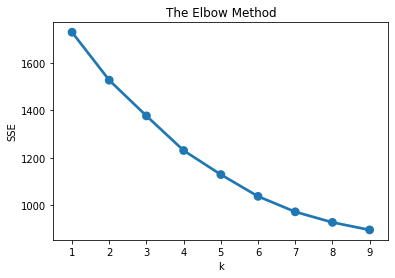

In [ ]:
sse = {}
for k in range(1, 10):   
    kmeans = KMeans(n_clusters=k, random_state=654)
    kmeans.fit(ft_standard)
    sse[k] = kmeans.inertia_
plt.title('The Elbow Method')
plt.xlabel('k')
plt.ylabel('SSE')
sns.pointplot(x=list(sse.keys()), y=list(sse.values()));

In [ ]:
kmeans = KMeans(n_clusters=2, random_state=654)
kmeans.fit(ft_standard)
cluster_labels = kmeans.labels_

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
kmeans2 = ft_standard.assign(Cluster = cluster_labels)
kmeans2.groupby(['Cluster']).agg({
'avg_transaction_cost': 'mean',
'mnths_operational': 'mean',
'days_yr': 'mean',
'avg_cost_item': 'mean',
'number_trucks': 'mean',
'dist_lobland': 'mean',
'bev_percent':  ['mean', 'count']
}).round(2)

avg_transaction_cost mnths_operational days_yr avg_cost_item  \
                        mean              mean    mean          mean   
Cluster                                                                
0                       0.18              0.22    0.23         -0.35   
1                      -0.23             -0.27   -0.29          0.43   

        number_trucks dist_lobland bev_percent        
                 mean         mean        mean count  
Cluster                                               
0                0.39        -0.35       -0.36   137  
1               -0.48         0.43        0.45   110

In [ ]:
kmeans = KMeans(n_clusters=3, random_state=654)
kmeans.fit(ft_standard)
cluster_labels = kmeans.labels_

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
kmeans3 = ft_standard.assign(Cluster = cluster_labels)
kmeans3.groupby(['Cluster']).agg({
'avg_transaction_cost': 'mean',
'mnths_operational': 'mean',
'days_yr': 'mean',
'avg_cost_item': 'mean',
'number_trucks': 'mean',
'dist_lobland': 'mean',
'bev_percent':  ['mean', 'count']
}).round(2)

avg_transaction_cost mnths_operational days_yr avg_cost_item  \
                        mean              mean    mean          mean   
Cluster                                                                
0                       0.26             -0.34   -0.26         -0.54   
1                      -0.05              1.33    0.88         -0.17   
2                      -0.16             -0.32   -0.19          0.45   

        number_trucks dist_lobland bev_percent        
                 mean         mean        mean count  
Cluster                                               
0                0.79        -0.06       -0.49    82  
1               -0.25        -0.40       -0.26    49  
2               -0.45         0.21        0.46   116

I will use 3 clusters for my k-means model.

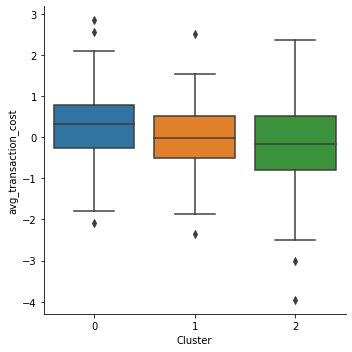

In [ ]:
sns.catplot(x='Cluster', y='avg_transaction_cost',kind="box", data=kmeans3);

Cluster 0 has the highest average customer expenditure per transaction at this particular food truck and cluster 2 has the lowest average customer expenditure per transaction.

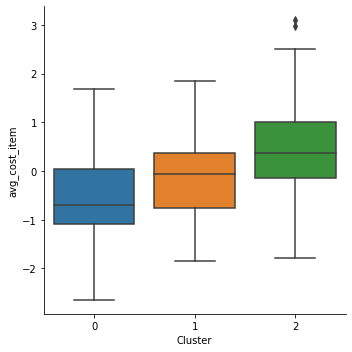

In [ ]:
sns.catplot(x='Cluster', y='avg_cost_item',kind="box", data=kmeans3);

Cluster 2 has the highest average customer expenditure per item sold at this particular food truck and Cluster 0 has the lowst average customer expenditure per item sold.

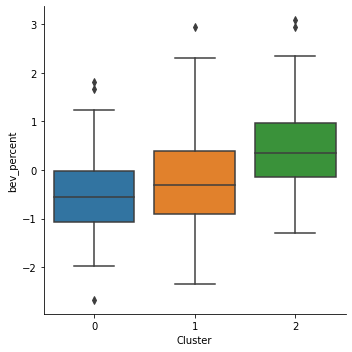

In [ ]:
sns.catplot(x='Cluster', y='bev_percent',kind="box", data=kmeans3);

Cluster 2 has the highest average percentage of sales made at this food truck that are attributable to beverages (as opposed to food) and the cluster has lowest average percentage of sales made at this food truck that are attributable to beverages .

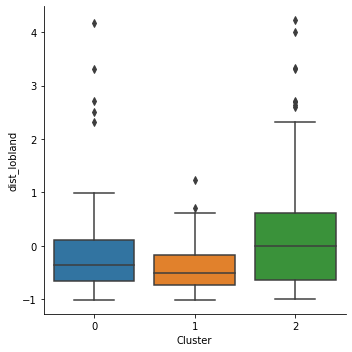

In [ ]:
sns.catplot(x='Cluster', y='dist_lobland',kind="box", data=kmeans3);

Cluster 1 has the shortest average distance to the front gate of  Lobster Land and cluster 2 has the largest average distance.

In [ ]:
kmeans3['Cluster'] = kmeans3['Cluster'].astype('category')

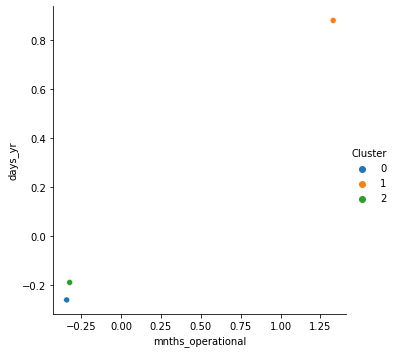

In [ ]:
ft_rel = kmeans3.groupby('Cluster')[['mnths_operational', 'days_yr']].mean()
sns.relplot(x='mnths_operational', y='days_yr', hue='Cluster', data=ft_rel);

Cluster 1 has the highest average operational months and the average number of days per year that plans to operate.

Cluster 0 is the non_local snack truck. Based on the above plots, the average customer expenditure per item sold is low but the average customer expenditure per transaction is high. The customers may buy more items on these trucks and the category fit a snack truck. 
Cluster 1 is the local truck because it has the shortest average distance to the front gate of Lobster Land. 
Cluster 2 is non_local beverage truck. Because it has a high average customer expenditure per item sold, low average customer expenditure per transaction, and a high average percentage of sales made at this food truck that is attributable to beverages. 


Lobster Land can use this model in several ways to optimize their food truck vendor selection. Based on the data visualization, the local truck has the highest average operational months and the average number of days per year that plans to operate. I think Lobster land can give the non-local truck more operating days because they have higher average customer expenditure per item sold and higher average customer expenditure per transaction. I believe the lobster land also can consider giving prime locations to non-local beverage trucks because they have higher average customer expenditure per item sold.  This model helps Lobster Land to manage their food truck vendors, maximize customer satisfaction, and increase revenue.

# Part II: Conjoint Analysis with a Linear Model

In [ ]:
woodie.head()

,bundleID,start_high,maxspeed,steepest_angle,seats_car,drop,track_color,avg_rating
0,1,Yes,40,50,2,100,red,7.613468
1,2,Yes,40,50,2,100,blue,5.266737
2,3,Yes,40,50,2,100,green,4.871951
3,4,Yes,40,50,2,100,white,4.453202
4,5,Yes,40,50,2,200,red,5.476815


In [ ]:
woodie.describe()

,bundleID,maxspeed,steepest_angle,seats_car,drop,avg_rating
count,288.000000,288.000000,288.000000,288.000000,288.000000,288.000000
mean,144.500000,60.000000,62.500000,3.000000,200.000000,6.171318
std,83.282651,16.358356,12.521758,1.001741,81.791781,2.033513
min,1.000000,40.000000,50.000000,2.000000,100.000000,0.292982
25%,72.750000,40.000000,50.000000,2.000000,100.000000,4.814940
50%,144.500000,60.000000,62.500000,3.000000,200.000000,6.076001
75%,216.250000,80.000000,75.000000,4.000000,300.000000,7.656706
max,288.000000,80.000000,75.000000,4.000000,300.000000,9.980000


The maxspeed, steepest_angle，seats_car， drop, and avg_rating are numeric and have valid mathematical meaning. The bundleID is numeric but does not have a valid mathematical meaning. The start_high and track_color are categorical variables.

In [ ]:
woodie2 = woodie.drop('bundleID', axis=1)

In [ ]:
woodie3=pd.get_dummies(woodie2, drop_first=True, columns = ['start_high', 'maxspeed', 'steepest_angle', 'seats_car', 'drop', 'track_color'])

The numeric input variables should be dummified because they are categorical in nature rather than continuous.

In [ ]:
woodie3.columns

Index(['avg_rating', 'start_high_Yes', 'maxspeed_60', 'maxspeed_80',
       'steepest_angle_75', 'seats_car_4', 'drop_200', 'drop_300',
       'track_color_green', 'track_color_red', 'track_color_white'],
      dtype='object')

In [ ]:
X = woodie3[[ 'start_high_Yes',
'maxspeed_60', 'maxspeed_80',
       'steepest_angle_75', 'seats_car_4', 'drop_200', 'drop_300',
       'track_color_green', 'track_color_red', 'track_color_white']]
y = woodie3['avg_rating']

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn import metrics
regressor = LinearRegression()
regressor.fit (X, y)

LinearRegression()

In [ ]:
coef_woodie3 = pd.DataFrame (regressor.coef_, X. columns, columns=['Coefficient'])
coef_woodie3

,Coefficient
start_high_Yes,1.056680
maxspeed_60,1.735847
maxspeed_80,1.494231
steepest_angle_75,-0.518575
seats_car_4,-0.442144
drop_200,1.041632
drop_300,1.199319
track_color_green,-0.065562
track_color_red,1.791008
track_color_white,-0.235712


In [ ]:
import statsmodels.api as sm
X2 = sm.add_constant(X)
model = sm.OLS(y, X2).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:             avg_rating   R-squared:                       0.472
Model:                            OLS   Adj. R-squared:                  0.453
Method:                 Least Squares   F-statistic:                     24.78
Date:                Sun, 05 Mar 2023   Prob (F-statistic):           3.07e-33
Time:                        23:57:26   Log-Likelihood:                -520.54
No. Observations:                 288   AIC:                             1063.
Df Residuals:                     277   BIC:                             1103.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                 3.9272      0.29

Based on the coefficients of the linear model, we can see that roller coasters that start at a higher altitude are associated with higher average ratings. The maxspeed_60 and maxspeed_80 variables both have positive coefficients. we believe that roller coasters with faster speeds tend to have higher ratings. The steepest_angle_75 and seats_car_4 variables have negative coefficients. This indicates that roller coasters with steeper angles and more seats are associated with lower ratings. The drop_200 and drop_300 variables both have positive coefficients, indicating that larger drops are associated with higher ratings. The track_color_red variable has a large positive coefficient, indicating that red-colored roller coasters tend to have higher ratings compared to those with other colors. 

Based on the coefficients of the linear model, we can conclude that the design elements that are most strongly associated with higher ratings are roller coasters that start at a high altitude, have faster speeds, flatter angles, fewer seats, larger drops, and red color. Lobster Land management can use these insights to inform their future roller coaster designs and marketing efforts. 
Based on the p-value of the linear model, we noticed that the number of seats, green color, and white color are not as significant as other variables. If lobster land has a limited budget, they can pay less for these features. 

# Part III: Wildcard: Marketing & Segments

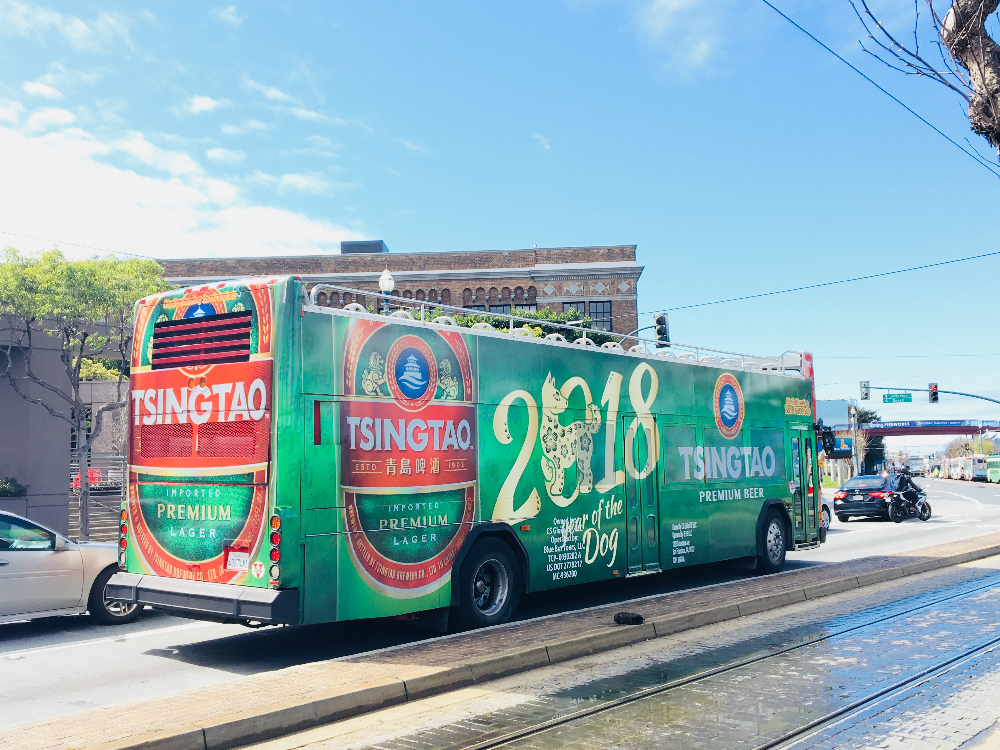

In [ ]:
from PIL import Image
img = Image.open('IMG_9937.JPG') 
img.show()

I looked at the ad on a Tourist bus in San Francisco. I don't drink beer and am not belong to the consumer segment of Tsingtao beer. The Tsingtao beer advertisement on the tourist bus in San Francisco is targeting consumers who are interested in trying an imported, premium beer with a larger serving size. This segment could include tourists who are interested in exploring different cultural experiences and trying new things. The use of Tsingtao's Chinese name in the ad may also appeal to consumers who are interested in Chinese culture and cuisine.

I think the ad is effective in reaching its target audience of tourists who are interested in cultural experiences and trying new things. The placement of the ad on a tourist bus is smart, as it targets consumers who are likely to be in a vacation mindset and open to trying new things. Additionally, the use of Tsingtao's Chinese name adds an element of authenticity and cultural appeal to the ad.